In [1]:
import pandas as pd
import numpy as np
#import sklearn as ss
import datetime
import tensorflow as tf
import gensim

In [2]:
dtypes = {'Scanned UPC': 'string'}
tdf = pd.read_csv("/Users/manalshah/Downloads/costello_ace_2015-2016.csv", dtype = dtypes)

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (9,10,11,12,20,23,24,25,29,30,31,32,35) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [13]:
tdf['Zip Code'].isna().sum()

5267587

In [ ]:
tdf.head()[]

In [8]:
len(tdf['Zip Plus-4'].unique())

16903

In [5]:
len(tdf['Zip Code'].unique())

11264

In [236]:
sale_df = tdf.loc[(tdf['Line Item Transaction Type'] == 'Sale')] 

In [6]:
sale_df = sale_df[["Item Description","Receipt Number", "Store #"]]

In [15]:
sale_df = sale_df[["Item Description","Receipt Number", "Store #", "Zip Code"]]

In [237]:
sale_df = sale_df[["Item Description","Receipt Number", "Store #", "Store Name"]]

In [238]:
transact_df = sale_df.dropna()

In [191]:
len(transact_df)

14339178

In [239]:
transact_df["Item Description"] = transact_df["Item Description"].str.replace(" ","_")
transact_df = transact_df.groupby(by = ["Store Name"])["Item Description"].apply(",".join).reset_index()
transact_df["Item Description"] = transact_df["Item Description"].str.split(",")

In [240]:
transact_df

,Store Name,Item Description
0,11116 BELLMORE,"[ULTRA_SPEC_500_SEMI-WHITE_--_GAL, BEN_EXT_SFT..."
1,11428 MASSAPEQUA PARK,"[18-8_ACORN_NUT_1/4-20, TIES_CABLE_8""_BLK100PK..."
2,11730 BETHPAGE,"[JRSY_GLOVE_W/DOTS_XL, DOUBLE_ROLLER_CATCH, HI..."
3,12168 WEST ISLIP,"[BLADE_CUTOFF_4.5X1/16MTL, CUT_WHL4-1/2X.045_M..."
4,14070 NEW HYDE PARK,"[SMOKE_ALRM_ION_LITH-BATT, TUBE_VINYL_1/4ID_X_..."
5,14252 ISLAND PARK,"[SANDSPONG_MED_WEDG_ACE, REGAL_SELECT_FLAT_SUP..."
6,14664 NORTH MASSAPEQUA,"[PEELER_SWIVEL_10""SS_BLK, CORDLESS_DUSTBUSTER_..."
7,14822 NORTHPORT,"[PLASTER_OF_PARIS_4.4, BAR_PRY_7""_WONDER_II, A..."
8,14874 WEST BABYLON,"[DROPCLOTH_9'X12'_3MIL, RED_BULL_ENRGY_DRNK_12..."
9,15110 GARDEN CITY PARK,"[1""IPS_CP_PLASTIC_F&C_PL, BULB_SOFTWHT_72W_ACE..."


In [241]:
ddd = list(zip(transact_df["Store Name"].tolist(), transact_df["Item Description"].tolist()))

In [242]:
def tagged_document(list_of_list_of_words):
   for i, list_of_words in list_of_list_of_words:
      yield gensim.models.doc2vec.TaggedDocument(list_of_words, [i])
data_for_training = list(tagged_document(ddd))

In [243]:
transact_df["Store Name"].unique()

array(['11116 BELLMORE', '11428 MASSAPEQUA PARK', '11730 BETHPAGE',
       '12168 WEST ISLIP', '14070 NEW HYDE PARK', '14252 ISLAND PARK',
       '14664 NORTH MASSAPEQUA', '14822 NORTHPORT', '14874 WEST BABYLON',
       '15110 GARDEN CITY PARK', '15238 SMITHTOWN', '15280 EAST ISLIP',
       '15348 ROCKY POINT', '15444 GREAT NECK', '15784 EI PAINT',
       '15863 COPIAGUE', '15998 BALDWIN HARBOR', '16038 NORTH BELLMORE',
       '16147 CALDWELL', '16324 BROOKLYN', '16354 LINCOLN PARK',
       '16660 GLEN BURNIE', '16661 PASADENA', '16663 EDGEWATER',
       '3164 NESCONSET', '5144 DEER PARK AVE', '6910 FARMINGDALE',
       '7504 GRAND BLVD', 'CLOSED CENTEREACH'], dtype=object)

In [52]:
transact_df["Item Description"] = transact_df["Item Description"].str.replace(" ","_")
transact_df = transact_df.groupby(by = ["Receipt Number","Store #"])#.apply(" ".join).reset_index()
# transact_df = transact_df.groupby(by = ["Zip Code"])["Item Description"].apply(",".join).reset_index()
# transact_df["Item Description"] = transact_df["Item Description"].str.split(",")

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [22]:
transact_df["Item Description"]

0        [GORILLA_TAPE_12YD, FASTENER_3/4X3"_WHT_INDR, ...
1        [FASTENERS/SCREWS/NAILS/BOLTS_ETC, FASTENERS/S...
2        [PVC_NIPPLE_SCH80_3/4X2", COUPLE_SCH40_PVC_3/4...
3        [CAULK_DAP3.0_K&B_WHT_9OZ, BIRDSEED_WILDBIRD_2...
4        [SWITCH_GRND_SP_15A_IVORY, NUT_SLIP_1.25X1.25P...
                               ...                        
11220                              [PROPANE_FUEL_16OZ_2PK]
11221    [SUET&PEANUTS_11.75OZ, LATCH_SAFETY_OVEN/APPLN...
11222                                    [MARKETING_FUNDS]
11223    [EASY_SET_POOL_8'_X_30", BULB_CAR_3157-BP_12V_...
11224                        [CONTRACTOR_BAGS_3MIL._20CNT]
Name: Item Description, Length: 11225, dtype: object

In [69]:
transact_df["Item Description"] = transact_df["Item Description"].str.replace(" ","_")
transact_df.set_index(["Receipt Number","Store #"], inplace = True)

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [71]:
kd = transact_df.groupby(level=[0,1]).agg({"Item Description":list, 
                                            "Zip Code":list})

In [72]:
kd

,,Item Description,Zip Code
Receipt Number,Store #,,
000001,Q,"[CAN_LINER_CLR_45-50_BX80, RAGS_INABX_10X12_BX...","[15110, 15110, 15110, 15110, 15110, 15110, 151..."
000098,S,[BATTRY_ALKLN_RAYO_D_PK12],[7006.0]
000099,S,[ACE_SNIPS_STRT_CUT_AVIAT],[7006.0]
000100,S,"[50LB_CALCIUM_CHLORIDE_FLAKES, LRG_PLASTIC_GAR...","[7006.0, 7006.0, 7006.0]"
000101,S,[DROPCLOTH_9'_X_12'_1MIL],[7006.0]
...,...,...,...
Y92798,6,[FASTENERS/SCREWS/NAILS/BOLTS_ETC],[11566.0]
Y92805,6,"[CONN_BUTT_INS22-16G_PK10, HORZ_GFCI_COVER_GRA...","[33904.0, 33904.0, 33904.0, 33904.0, 33904.0, ..."
Y95149,B,[COOLER_PM_GRIPPER22_TECH],[11784.0]


In [79]:
import scipy.stats as ss
ss.mode([1,1,2,1,3,1])[0][0]

1

In [80]:
kd["Zips"] = kd["Zip Code"].apply(lambda x: ss.mode(x)[0][0])

In [93]:
kd.reset_index(drop = True, inplace = True)

In [94]:
kd.index

RangeIndex(start=0, stop=3936459, step=1)

In [99]:
unique_zips = kd["Zips"].unique()

In [100]:
bad_zips = []
for i in unique_zips:
    try:
        float(i)
    except:
        bad_zips.append(i)

In [101]:
bad_zips

[]

In [97]:
kd = kd.drop(kd[kd["Zips"].isin(['M6A2W', 'NY', '-', 'SPE'])].index)

In [102]:
kd = kd[["Item Description","Zips"]]

In [165]:
kd["Zips"] = kd["Zips"].astype('float64').astype('int32')

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [166]:
mf = kd.groupby(by = ["Zips"]).agg({"Item Description":list})#.reset_index(inplace = True)

In [167]:
mf["Item Description"].apply(oneDArray).tolist()

[['GLUE_ALL_GALLON_ELMERS',
  'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
  'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
  'MURIATIC_ACID_REPL_GAL',
  'FLEECE_HEADBAND',
  'TRUFUEL_40:1_32OZ',
  'ACE_CASING_NAIL_3"_1#',
  'CLICK_N_FLAME_LIGHTERS',
  'CLICK_N_FLAME_LIGHTERS',
  'CAULK_TOOL_KIT_4_PC',
  'SILICONE_II_K&B_CLR2.8OZ',
  'DRUM_BAGS_55GAL_2MIL._20CNT',
  'GORILLA_TAPE_12YD',
  'FASTENER_3/4X3"_WHT_INDR',
  'CATCH_MAGNTC_2"X1-1/8"',
  'DRAIN_BOILR_BRASS_1/2MPT',
  'PRSSR_MSTR_HOSE5/8"X75\'',
  "HOSE_REEL_CART_175'",
  'WASHR_HOSE_RUBBR_10/PK',
  'FLASHLITE-MINMAG_BLKCMBO',
  'BUNGEE_CORD_12PC_ASSTD',
  'FILTER_AIR_PLEAT_24X30X1',
  'FILTER_AIR_PLEAT_24X30X1',
  'LEVER_FLUSH_SIDE_MOUNT',
  'WASHER_CONE_TYPE_Q',
  "POCKET_HOSE_DURA-RIB_75'",
  'SPRINKLR_SPOT_CIRC_ACE',
  'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
  '5W_LED_CAND_BASE_DECOR_BULB_DIM',
  '40W_G25_STD_WHT',
  'UTILITY_LIGHTER_2PK',
  'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
  'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
  'FASTENERS/SCREWS/NAILS/BOLTS_ET

In [107]:
import itertools

def oneDArray(x):
    return list(itertools.chain(*x))

In [168]:
ddd = list(zip(mf.index.tolist(), mf["Item Description"].apply(oneDArray).tolist()))

In [216]:
transact_df["Item per Receipt"] = transact_df["Item Description"].apply(lambda x: len(x))

In [217]:
transact_df["Item per Receipt"].value_counts().sort_values()

1167048    1
413082     1
495114     1
1753612    1
831807     1
526144     1
442711     1
710764     1
542510     1
334631     1
400656     1
239912     1
795155     1
785060     1
97983      1
362527     1
447710     1
199369     1
263243     1
129911     1
571270     1
615157     1
569878     1
153549     1
479495     1
132505     1
579715     1
42749      1
310193     1
Name: Item per Receipt, dtype: int64

In [219]:
transact_df.sort_values("Item per Receipt")

,Store Name,Item Description,Item per Receipt
16,15998 BALDWIN HARBOR,"[CAN_LINER_CLR_45-50_BX80, RAGS_INABX_10X12_BX...",42749
14,15784 EI PAINT,"[REG_SEL_INT_MATTE_BS1_GL, REG_SEL_INT_MATTE_B...",97983
21,16660 GLEN BURNIE,"[COUPLHOSE_3/4""ML_CLINCH, TRAP_MOUSE_EASYSET_2...",129911
27,7504 GRAND BLVD,"[HX_BOLTS_USS_Z_3/8X3_______50, FASTENERS/SCRE...",132505
25,5144 DEER PARK AVE,"[REG_SEL_INT_EGGSHL_B3_GL, WOOD_CLEANR_12.5_OZ...",153549
19,16324 BROOKLYN,"[FASTENERS/SCREWS/NAILS/BOLTS_ETC, RECEPT_GRND...",199369
13,15444 GREAT NECK,"[HASP_FXD_SAFETY_3-1/4""ZN, PAD_FELT_1""_CIRCLE_...",239912
20,16354 LINCOLN PARK,"[TIC_TAC_BIG_FRESHMINT, PAPR_YARD_BAG_ACE30G_P...",263243
28,CLOSED CENTEREACH,"[CYLINDER_PROPANE14.1OZ, REMOVERBUG/TAR_TRIGR_...",310193
11,15280 EAST ISLIP,"[ULTRA_BUNGEE_CORD_32"", BASKET_STRAINR_AH820-2...",334631


In [233]:
set(transact_df[transact_df["Store Name"]=="11730 BETHPAGE"]["Item Description"].values[0])-set(transact_df[transact_df["Store Name"]=="11428 MASSAPEQUA PARK"]["Item Description"].values[0])

{'ROLLER_6"MINI_GOLDSTRIPE',
 'TIRE_TOP_OFF_CMPRSSR_12V',
 'TITANIUM_DRILL_KIT_29PC',
 'HARDWOOD_FLOOR_CLN_32OZ',
 'SNPWR_SQ_W/LID_CLEAR_4C',
 'CRYSTAL_OVR_DRWR/CAB_DBL_HK-CL',
 '5285226_$5_INST_SAVINGS',
 'RING_KEY_LTHR_W/SNAP_CD1',
 'FIN_HX_NT_SAE_Z_9/16-18',
 'FH_PHL_MS_Z_8-32X5/8',
 '2"X5"_MARGIN_TROWEL',
 'KIT_REPAIR-DELTA_LVR_HND',
 'SAN_JOSE_FIREPIT_TABLE',
 'BUSHING_40PVC_1.5M1/2FPT',
 'HWH_SELF-DRILL_6X1/2',
 'GRILLE_DOOR_19"X36"_WHT',
 'HAPPY_HOL_E1_$5_OFF_$25',
 'DISK_FIBER_HT_1.75X1/8HL',
 'GLOVES-WH_NYLON_W/GREY_NITR(LRG)',
 '12OZ_AERO_POLR_ULT_SUP_SPRY_PNT',
 'NUMBER_4"_ZINC_SAT_NKL_8',
 'PLASTIDIP_SPRY11OZ_PURML',
 'GUARD_SPLASH_DISPOSER_B',
 '_THE_LIVING_IS_EASY',
 'CERAMIC_TILE_SCORER',
 'ROTRY_LIT_DIMMR1POLERFI',
 'UPHOLSTRY_STAIN&SPOT_LFT',
 'SEAL_COOLING_SYSTEM.75OZ',
 'HANDLES_CHAR_GRILL',
 'KEY_GM_B68',
 'BRACKET_PLANTER_10"BLACK',
 'GRILL_GRATE_SCRUBBER',
 'PEANUTS_KEY_CHAIN',
 'GLUE_CARPET_OUTDOOR_GAL',
 'TAPE_PLAST1.5"X125"BLK3M',
 'PIPE_WRENCH_18"_SG',
 'MAGNE

In [246]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

In [247]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/manalshah/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [169]:
def tagged_document(list_of_list_of_words):
   for i, list_of_words in list_of_list_of_words:
      yield gensim.models.doc2vec.TaggedDocument(list_of_words, [i])
data_for_training = list(tagged_document(ddd))

In [170]:
data_for_training

[TaggedDocument(words=['GLUE_ALL_GALLON_ELMERS', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', 'MURIATIC_ACID_REPL_GAL', 'FLEECE_HEADBAND', 'TRUFUEL_40:1_32OZ', 'ACE_CASING_NAIL_3"_1#', 'CLICK_N_FLAME_LIGHTERS', 'CLICK_N_FLAME_LIGHTERS', 'CAULK_TOOL_KIT_4_PC', 'SILICONE_II_K&B_CLR2.8OZ', 'DRUM_BAGS_55GAL_2MIL._20CNT', 'GORILLA_TAPE_12YD', 'FASTENER_3/4X3"_WHT_INDR', 'CATCH_MAGNTC_2"X1-1/8"', 'DRAIN_BOILR_BRASS_1/2MPT', 'PRSSR_MSTR_HOSE5/8"X75\'', "HOSE_REEL_CART_175'", 'WASHR_HOSE_RUBBR_10/PK', 'FLASHLITE-MINMAG_BLKCMBO', 'BUNGEE_CORD_12PC_ASSTD', 'FILTER_AIR_PLEAT_24X30X1', 'FILTER_AIR_PLEAT_24X30X1', 'LEVER_FLUSH_SIDE_MOUNT', 'WASHER_CONE_TYPE_Q', "POCKET_HOSE_DURA-RIB_75'", 'SPRINKLR_SPOT_CIRC_ACE', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', '5W_LED_CAND_BASE_DECOR_BULB_DIM', '40W_G25_STD_WHT', 'UTILITY_LIGHTER_2PK', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', 'FASTENERS/SCREWS/NAILS/BOLTS_ETC', '40%_

In [244]:
def getWordsFromTags(tag):
    #tags = []
    for i in data_for_training:
        #tags.append(i.tags[0])
        if i.tags[0] == tag:
            return i.words

In [180]:
tags = []
for i in data_for_training:
    tags.append(i.tags[0])

In [181]:
tags

[0,
 1,
 11,
 117,
 153,
 312,
 646,
 662,
 664,
 687,
 700,
 714,
 745,
 775,
 795,
 802,
 820,
 936,
 949,
 979,
 1002,
 1006,
 1013,
 1020,
 1027,
 1028,
 1030,
 1033,
 1035,
 1036,
 1040,
 1060,
 1069,
 1075,
 1077,
 1098,
 1104,
 1123,
 1124,
 1157,
 1158,
 1161,
 1162,
 1170,
 1172,
 1195,
 1223,
 1224,
 1226,
 1230,
 1238,
 1240,
 1247,
 1257,
 1267,
 1301,
 1360,
 1375,
 1420,
 1432,
 1453,
 1462,
 1475,
 1519,
 1520,
 1523,
 1527,
 1532,
 1540,
 1543,
 1545,
 1550,
 1560,
 1596,
 1602,
 1605,
 1606,
 1609,
 1634,
 1701,
 1702,
 1720,
 1731,
 1746,
 1748,
 1749,
 1752,
 1754,
 1756,
 1757,
 1760,
 1770,
 1773,
 1776,
 1778,
 1795,
 1801,
 1803,
 1810,
 1824,
 1827,
 1830,
 1844,
 1851,
 1860,
 1880,
 1886,
 1890,
 1906,
 1913,
 1921,
 1930,
 1938,
 1940,
 1945,
 1951,
 1960,
 1966,
 1983,
 1985,
 2021,
 2038,
 2043,
 2045,
 2050,
 2052,
 2053,
 2054,
 2056,
 2061,
 2062,
 2066,
 2067,
 2072,
 2081,
 2090,
 2114,
 2117,
 2131,
 2132,
 2139,
 2141,
 2149,
 2155,
 2176,
 2189,
 21

In [177]:
len(data_for_training)

6226

In [35]:
#tagged_data = [TaggedDocument(words=word_tokenize(str(_d).replace("[","").replace("]","")), tags=[str(i)]) for i, _d in ddd]

In [36]:
#tagged_data[0]

TaggedDocument(words=["'GORILLA_TAPE_12YD", "'", ',', "'FASTENER_3/4X3", "''", '_WHT_INDR', "'", ',', "'CATCH_MAGNTC_2", "''", 'X1-1/8', "''", "'", ',', "'DRAIN_BOILR_BRASS_1/2MPT", "'", ',', "'SHARKBITE_CHKVALVE1/2LF", "'", ',', "'SHARKBITE_COUPLE_3/4", "''", '_LF', "'", ',', "'TRAP_P_PVC_1.5X1.5_BAG", "'", ',', "'FLEX_SEAL_WHITE_14OZ", "'", ',', "'COUPLE_1.5DWV1.5SCH40HXH", "'", ',', "'ELBOW90PVC_DWV1.5", "''", 'STREET', "'", ',', "'40W_G25_STD_WHT", "'", ',', "'UTILITY_LIGHTER_2PK", "'", ',', "'TAPE_REFLCT_RED/SLVR2X24", "'", ',', "'GLUE_ALL_GALLON_ELMERS", "'", ',', "'BULB_MINI_CLR_5PK_GE", "'", ',', "'FASTENERS/SCREWS/NAILS/BOLTS_ETC", "'", ',', "'FASTENERS/SCREWS/NAILS/BOLTS_ETC", "'", ',', "'CAULK_TOOL_KIT_4_PC", "'", ',', "'SILICONE_II_K", '&', 'B_CLR2.8OZ', "'", ',', "'CLICK_N_FLAME_LIGHTERS", "'", ',', "'CLICK_N_FLAME_LIGHTERS", "'", ',', "'ICE_MELT_4300_12", '#', '_JUG', "'", ',', "'RUBBER_MALLET_32_OZ", "'", ',', "'FILTER_AIR_PLEAT_24X30X1", "'", ',', "'FILTER_AIR_PLEAT_24X

In [ ]:
model_doc = Doc2Vec(window=5, min_count=2, workers=8)

In [171]:
model = Doc2Vec(workers = 8, min_count=2, window = 10)
model.build_vocab(data_for_training)
model.train(data_for_training, total_examples=model.corpus_count, epochs=model.epochs)

In [248]:
model_s = Doc2Vec(workers = 8, min_count=2, window = 1000000, size = 30)
model_s.build_vocab(data_for_training)
model_s.train(data_for_training, total_examples=model_s.corpus_count, epochs=model_s.epochs)

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/gensim/models/doc2vec.py:319: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


In [249]:
model_s.save_word2vec_format('doc_tensor_store.w2v', doctag_vec=True, word_vec=False)

In [254]:
import gensim.scripts.word2vec2tensor
gensim.scripts.word2vec2tensor.word2vec2tensor('doc_tensor_store.w2v', 'store_doc', binary=True)

In [223]:
model_s.docvecs.most_similar([model_s.infer_vector(getWordsFromTags('14252 ISLAND PARK'))])

[('6910 FARMINGDALE', 0.6141163110733032),
 ('14874 WEST BABYLON', 0.4106924533843994),
 ('14664 NORTH MASSAPEQUA', 0.2727876901626587),
 ('16324 BROOKLYN', 0.13889557123184204),
 ('14252 ISLAND PARK', 0.12087111175060272),
 ('16147 CALDWELL', 0.08418309688568115),
 ('15110 GARDEN CITY PARK', 0.034794583916664124),
 ('16661 PASADENA', 0.026906296610832214),
 ('15444 GREAT NECK', 0.008082546293735504),
 ('16354 LINCOLN PARK', -0.01147829182446003)]

In [224]:
model_s.docvecs.most_similar([model_s.infer_vector(getWordsFromTags('3164 NESCONSET'))])

[('6910 FARMINGDALE', 0.5788595676422119),
 ('14664 NORTH MASSAPEQUA', 0.5613858103752136),
 ('14874 WEST BABYLON', 0.45505690574645996),
 ('3164 NESCONSET', 0.42905524373054504),
 ('16147 CALDWELL', 0.20552845299243927),
 ('14822 NORTHPORT', 0.2051442712545395),
 ('16324 BROOKLYN', 0.20389464497566223),
 ('16661 PASADENA', 0.08788911253213882),
 ('16354 LINCOLN PARK', 0.0821416825056076),
 ('15110 GARDEN CITY PARK', 0.040189847350120544)]

In [234]:
model_s.docvecs.most_similar([model_s.infer_vector(['HARDWOOD_FLOOR_CLN_32OZ'])])

[('CLOSED CENTEREACH', 0.35034680366516113),
 ('15784 EI PAINT', 0.35004478693008423),
 ('14070 NEW HYDE PARK', 0.31205111742019653),
 ('11730 BETHPAGE', 0.27031323313713074),
 ('15280 EAST ISLIP', 0.2583436071872711),
 ('14252 ISLAND PARK', 0.23400819301605225),
 ('15998 BALDWIN HARBOR', 0.1957586705684662),
 ('16324 BROOKLYN', 0.19298703968524933),
 ('11116 BELLMORE', 0.15045712888240814),
 ('16661 PASADENA', 0.10339926928281784)]

In [176]:
tdf["Store Name"].unique()

array(['15784 EI PAINT', '12168 WEST ISLIP', '14252 ISLAND PARK',
       '15348 ROCKY POINT', '6910 FARMINGDALE', '11730 BETHPAGE',
       '7504 GRAND BLVD', '11116 BELLMORE', '15110 GARDEN CITY PARK',
       '5144 DEER PARK AVE', '3164 NESCONSET', '16661 PASADENA',
       '15863 COPIAGUE', '14822 NORTHPORT', '14874 WEST BABYLON',
       '11428 MASSAPEQUA PARK', '16663 EDGEWATER', '15238 SMITHTOWN',
       '15280 EAST ISLIP', '16147 CALDWELL', '14070 NEW HYDE PARK',
       '14664 NORTH MASSAPEQUA', '15444 GREAT NECK', '16660 GLEN BURNIE',
       'CLOSED CENTEREACH', 'Store Name', '16354 LINCOLN PARK',
       '16324 BROOKLYN', '16038 NORTH BELLMORE', '15998 BALDWIN HARBOR',
       nan], dtype=object)

In [140]:
model.docvecs[11]

array([-4.8639625e-03, -3.5829695e-03,  2.8904548e-04,  1.3603501e-03,
        6.5102396e-03,  9.2333695e-03, -2.7407713e-03,  1.5932657e-02,
        1.7610017e-03, -4.1706949e-03, -1.0780452e-02, -4.0716659e-03,
        3.5940567e-03, -3.3568793e-03,  8.5173780e-03,  1.1717258e-02,
       -8.2385279e-03,  5.0923070e-03, -2.4035610e-03,  7.3063839e-03,
       -5.0842343e-03, -2.8764112e-03,  7.9124598e-03, -7.3742969e-03,
        4.3877668e-04,  2.8231835e-03,  1.9072172e-03, -2.2966766e-03,
        8.9226970e-03,  7.4617029e-03, -4.2863730e-03,  4.4974512e-03,
        5.6757675e-03, -1.1287491e-02, -7.0161006e-04,  8.6345803e-04,
       -3.9070016e-03, -1.6508063e-03,  8.8824535e-04,  1.2159611e-03,
        3.1558931e-04,  2.4340684e-03,  5.1998403e-03, -5.9160134e-03,
        6.9854818e-03, -8.4467828e-03, -4.7787474e-03, -1.0930033e-03,
       -2.9438976e-03, -4.5189802e-03, -9.3899006e-03,  5.5666999e-03,
        1.2228115e-02, -2.6367451e-03,  6.6034957e-03, -1.1893298e-02,
      

In [157]:
getWordsFromTags(11790)

['SHARPENING_SERVICE',
 'RTR_BIT_1/2R_ROUNDOVER',
 'RTR_BIT_3/8R_ROUNDOVER',
 'HOLSTER_HAMMER_SWINGER',
 'C+K_EXT_PP1_FLT_NEUT_GL',
 'C+K_EXT_PP1_SAT_DSWHT_GL',
 'PAINTBRSH_SET1.5"+4"LNZR',
 'PAINTBRSH_SET2"+3"LINZER',
 'CAULK_PHENOSEAL_CLR_10OZ',
 'RAGS_INABX_10X12_BX200',
 'DUSTING_MITT',
 'MW_HDWD_FLR_CARE_SYSTEM',
 'MICROFIBER_WOOL_DUSTER',
 'WOOL_DUSTER_17.5"',
 'SCRW_TRIM_SQ_P6X2-1/4_1#',
 'FASTENERS',
 'TREE_BRN_W/108_MLT_LED',
 'BATTERY_ALKLINE_12_VOLT',
 'BATTRY_LITHUM_3V_2032PK2',
 'TIE_PLATE_TP37',
 'ROLLER/FRAME_6X1/4FOAM22',
 'CONTRACTOR_1ST_3/8"_3-PK',
 'ACE_JOINT_TAPE2-1/16"X75',
 'ADH_PL200_10OZ_VOC-ALL',
 'POWER_STAKE_6-OUTLET',
 'CONCRETE_MIX_10#QKRTE',
 'WINDEX_COMMERCIAL_32OZ',
 'GRN_PURE_TURPENTINE_QT',
 'BULB-DEC_25FM/AU_CD2_GE',
 'S/F_RESPIRATOR_2PK',
 'PARTICLE_RESPIRATOR_N95',
 'GLASSES_CLR_W/BLK_FRAME',
 'BASKET_LAUNDRY_HIPHUGGER',
 'ROUND_OUTLET_BX_5HL_WHT',
 'CEMENT/PRIMER_PVC_4OZPK2',
 'COUPLE_2"_SXS_SCH40',
 'COUPLE_1.5"_SXS_SCH40',
 'ADAPTER_PVC_DWV1.5"HX

In [158]:
model.infer_vector(getWordsFromTags(11790))

array([ 0.06419817, -0.9393314 , -0.25524032, -0.34491572,  0.5316762 ,
        0.85837716,  0.45478907,  1.2170277 ,  0.68980783, -0.787782  ,
       -2.3669581 , -0.2445573 , -0.4873741 , -0.6660362 ,  0.9397578 ,
        0.9535626 , -0.6245241 , -0.15536779,  0.01489604,  0.2641945 ,
       -0.03769112,  0.4778711 , -0.11871921, -0.57718784,  0.20284659,
        1.171589  ,  1.6707224 , -0.202539  ,  1.1575742 ,  1.8305502 ,
        0.27810106,  0.05521511, -0.7169398 , -0.11652734, -0.20342664,
       -0.9236082 , -0.28220475, -1.0600992 ,  0.8452435 , -0.01990058,
       -0.98343825, -0.2521905 ,  0.1897148 , -1.2445318 ,  0.8643555 ,
        0.07406804,  0.3985421 , -0.0438411 , -0.24082315, -0.69687355,
       -0.79621595,  1.519266  ,  0.21666175, -0.07270779,  0.6392401 ,
       -1.0940888 , -1.1367391 ,  0.69494545, -1.0728303 , -0.4076198 ,
        0.17728591,  1.0862203 , -0.6896159 , -0.22534235, -0.5168773 ,
        0.1130412 , -0.18457255, -0.63043344, -0.3178255 ,  0.20

In [172]:
model.docvecs.most_similar([model.infer_vector(getWordsFromTags(11790))])

[(11790, 0.8679919242858887),
 (44446, 0.8548998236656189),
 (30189, 0.8471064567565918),
 (11763, 0.8461884260177612),
 (2050, 0.8354382514953613),
 (11727, 0.8250235319137573),
 (11784, 0.8214335441589355),
 (27312, 0.8168582320213318),
 (28791, 0.8161958456039429),
 (11772, 0.8084915280342102)]

In [186]:
getWordsFromTags(10276)

['ALCOHOL_ISO_1GAL']

In [187]:
getWordsFromTags(28314)

['SANTA_FACE_36"',
 'SPRY_PNT_CM_GLS_KHKI',
 'STNBL_WD_FLR__1PT',
 'PLASTIC_WOOD_FILLER_16OZ',
 'SILICONEII_W&D_CLR10.1OZ',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'HINGE_NON-MORT_2-1/2_BB',
 'SINGLE_TOUCH_LATCH_BROWN',
 'MOUNTING_TAPE',
 'THROTTLE_CONTROL_T-KNOB',
 "POWERCNTR_14/3_SJTW_10'",
 'HINGE_NON-MORT_2-1/2_BB',
 'DLX_ELECTRC_CAN_OPENR_SS',
 'STAIN_MINWX8OZ_GOLDN_OAK',
 'CONDITION_WOOD_MINWAX_PT',
 'PAINT_SPRYR_SYSTEM_6OZ',
 'GRN_DENATURED_ALCOHOL_QT',
 'TUB_STOP_1-1/2-2"_ACE',
 'SPRYKRYLON_BRITEGOLD11OZ',
 'SPRYPNT_2X_WHITE_PRIMER',
 'HAL_BULB_150WQ/CL_MINICAN',
 '250W_Q/CL_MINI_CAN_CARDED',
 'LUCKY_GARDEN_FELT_FLAG',
 'BLACK_WEEKLY_PILL_CASE-28_DAYS',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 "SOLAR_UMBRELLA9'HNTR_GRN",
 'SOLAR_WATERCAN_STAKE_35"',
 'BRKR_EATON_1P_20A_1"',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'FASTENERS/SCREWS/NAILS/BOLTS_ETC',
 'FASTENERS/SCREWS/NAILS/BO

In [185]:
model.docvecs.most_similar([model.infer_vector(getWordsFromTags(10276))], topn = 100)

[(28314, 0.9035125374794006),
 (19085, 0.903100311756134),
 (13752, 0.9011937379837036),
 (91608, 0.8990476131439209),
 (31410, 0.8988265991210938),
 (22301, 0.8985027074813843),
 (94597, 0.8984010219573975),
 (33955, 0.8982514142990112),
 (95125, 0.8978866338729858),
 (4282, 0.8965613842010498),
 (20617, 0.896452784538269),
 (20816, 0.8956347703933716),
 (28241, 0.8955426216125488),
 (21601, 0.895382821559906),
 (34446, 0.8948978185653687),
 (15218, 0.8948836326599121),
 (10980, 0.89449542760849),
 (54956, 0.8942902088165283),
 (34684, 0.8942557573318481),
 (46140, 0.8933809995651245),
 (11759, 0.8931479454040527),
 (83127, 0.8926591873168945),
 (30117, 0.8925292491912842),
 (10553, 0.8922524452209473),
 (32038, 0.89211505651474),
 (32176, 0.8920531272888184),
 (24122, 0.8913097977638245),
 (11959, 0.8911910653114319),
 (11712, 0.8910493850708008),
 (4079, 0.8907382488250732),
 (21643, 0.8904096484184265),
 (22102, 0.8901815414428711),
 (13090, 0.8899455070495605),
 (10453, 0.88904535

In [184]:
model.save("./doc2vec_1.model")

In [7]:
transact_df = sale_df.dropna()

In [8]:
transact_df["Item Description"] = transact_df["Item Description"].str.replace(" ","_")
transact_df = transact_df.groupby(by = ["Receipt Number","Store #"])["Item Description"].apply(",".join).reset_index()
transact_df["Item Description"] = transact_df["Item Description"].str.split(",")

In [9]:
transact_df["Item Description"]

0          [CAN_LINER_CLR_45-50_BX80, RAGS_INABX_10X12_BX...
1                                 [BATTRY_ALKLN_RAYO_D_PK12]
2                                 [ACE_SNIPS_STRT_CUT_AVIAT]
3          [50LB_CALCIUM_CHLORIDE_FLAKES, LRG_PLASTIC_GAR...
4                                  [DROPCLOTH_9'_X_12'_1MIL]
                                 ...                        
6355039                   [FASTENERS/SCREWS/NAILS/BOLTS_ETC]
6355040    [CONN_BUTT_INS22-16G_PK10, HORZ_GFCI_COVER_GRA...
6355041                           [COOLER_PM_GRIPPER22_TECH]
6355042    [ANTI-SKID_PAD_RND_2"_CD4, MEMO_BOOK_W/PEN, LI...
6355043    [SHEAR_HDG_SERRATED_23", LOPPER_ANVILHVYDUTY_32"]
Name: Item Description, Length: 6355044, dtype: object

In [10]:
transact_df["Item per Receipt"] = transact_df["Item Description"].apply(lambda x: len(x))

In [11]:
transact_df["Item per Receipt"].value_counts()[:10]

1     2898290
2     1586873
3      830987
4      442569
5      240365
6      135196
7       78561
8       47620
9       30168
10      19004
Name: Item per Receipt, dtype: int64

In [12]:
model1 = gensim.models.Word2Vec(window=5, min_count=2, workers=8)

In [13]:
model1.epochs

5

In [12]:
model1.build_vocab(transact_df["Item Description"], progress_per=1000)

In [13]:
model1.train(transact_df["Item Description"], total_examples = model1.corpus_count, epochs=model1.epochs)

(66889315, 71967300)

In [14]:
from gensim.models import Word2Vec
from gensim.models.callbacks import CallbackAny2Vec

class callback(CallbackAny2Vec):
    '''Callback to print loss after each epoch.'''

    def __init__(self):
        self.epoch = 0
        self.loss_to_be_subed = 0

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        loss_now = loss - self.loss_to_be_subed
        self.loss_to_be_subed = loss
        print('Loss after epoch {}: {}'.format(self.epoch, loss_now))
        self.epoch += 1

model_t = Word2Vec(transact_df["Item Description"], size=100, workers=8, \
                    min_count=2, iter=30, window=5, compute_loss=True, callbacks=[callback()])
#model_t.save('./model_t.model')

Loss after epoch 0: 4760413.5
Loss after epoch 1: 3104505.5
Loss after epoch 2: 3780500.0
Loss after epoch 3: 3821425.0
Loss after epoch 4: 2227240.0
Loss after epoch 5: 1374596.0
Loss after epoch 6: 1298562.0
Loss after epoch 7: 1308118.0
Loss after epoch 8: 1280654.0
Loss after epoch 9: 1285894.0
Loss after epoch 10: 1285784.0
Loss after epoch 11: 1232828.0
Loss after epoch 12: 1221718.0
Loss after epoch 13: 1263990.0
Loss after epoch 14: 1199370.0
Loss after epoch 15: 1222374.0
Loss after epoch 16: 1207486.0
Loss after epoch 17: 1024098.0
Loss after epoch 18: 755376.0
Loss after epoch 19: 724780.0
Loss after epoch 20: 739568.0
Loss after epoch 21: 723396.0
Loss after epoch 22: 738288.0
Loss after epoch 23: 721192.0
Loss after epoch 24: 712824.0
Loss after epoch 25: 699388.0
Loss after epoch 26: 669064.0
Loss after epoch 27: 648144.0
Loss after epoch 28: 651256.0
Loss after epoch 29: 656740.0


In [15]:
model_t.save('./model_t.model')

In [17]:
loss_values = [4760413.5,
3104505.5,
3780500.0,
3821425.0,
2227240.0,
1374596.0,
1298562.0,
1308118.0,
1280654.0,
1285894.0,
1285784.0,
1232828.0,
1221718.0,
1263990.0,
1199370.0,
1222374.0,
1207486.0,
1024098.0,
755376.0,
724780.0,
739568.0,
723396.0,
738288.0,
721192.0,
712824.0,
699388.0,
669064.0,
648144.0,
651256.0,
656740.0]

In [18]:
num_epochs =list(range(30))

In [19]:
num_epochs

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [14]:
model1.wv.most_similar("KEY_SCHLAGE_SC1-ACE250PK")

[('KEY_ARROW_AR1-ACE', 0.8122216463088989),
 ('KEY_KWIKSET_KW1-ACE250PK', 0.7945127487182617),
 ('KEY_YALE_Y11-ACE', 0.7876434922218323),
 ('KEY_SEGAL_SE1-ACE', 0.7831317186355591),
 ('KEY_YALE_Y1-ACE', 0.7690198421478271),
 ('KEY_MASTER_M1-ACE250PK', 0.7620893716812134),
 ('KEY_BALDWIN_5PIN_BW5', 0.7449060678482056),
 ('KEY_SCHLAGE_SC4-ACE', 0.7327520847320557),
 ('KEY_NATIONAL_NA14-ACE', 0.7296087741851807),
 ('KEY_CAPS_5_PK_______5', 0.7213194370269775)]

In [15]:
model1.save("./word2vec_11.model")

In [ ]:
import pickle
file = open('transact_df', 'wb')
transact_df.to_pickle(file)
file.close()

In [5]:
import pickle
file = open('MAP_5_10', 'rb')
mt = pickle.load(file)
file.close()

In [16]:
model11 = gensim.models.Word2Vec.load("word2vec_11.model")

In [17]:
model11.wv.most_similar("KEY_SCHLAGE_SC1-ACE250PK")

[('KEY_ARROW_AR1-ACE', 0.8122216463088989),
 ('KEY_KWIKSET_KW1-ACE250PK', 0.7945127487182617),
 ('KEY_YALE_Y11-ACE', 0.7876434922218323),
 ('KEY_SEGAL_SE1-ACE', 0.7831317186355591),
 ('KEY_YALE_Y1-ACE', 0.7690198421478271),
 ('KEY_MASTER_M1-ACE250PK', 0.7620893716812134),
 ('KEY_BALDWIN_5PIN_BW5', 0.7449060678482056),
 ('KEY_SCHLAGE_SC4-ACE', 0.7327520847320557),
 ('KEY_NATIONAL_NA14-ACE', 0.7296087741851807),
 ('KEY_CAPS_5_PK_______5', 0.7213194370269775)]

In [18]:
del(transact_df)

In [19]:
dtypes = {'Scanned UPC': 'string'}
test_tdf = pd.read_csv("/Users/manalshah/Downloads/costello_ace_2017-2018.csv", dtype = dtypes)

/Users/manalshah/opt/anaconda3/envs/tf/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (9,10,11,12,20,23,24,25,29,30,31,32,35) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [20]:
test_sale_df = test_tdf.loc[(test_tdf['Line Item Transaction Type'] == 'Sale')]

In [21]:
test_sale_df = test_sale_df[["Item Description","Receipt Number", "Store #"]]

In [23]:
del(test_tdf)

In [24]:
test_transact_df = test_sale_df.dropna()

In [25]:
test_transact_df["Item Description"] = test_transact_df["Item Description"].str.replace(" ","_")
test_transact_df = test_transact_df.groupby(by = ["Receipt Number","Store #"])["Item Description"].apply(",".join).reset_index()
test_transact_df["Item Description"] = test_transact_df["Item Description"].str.split(",")

In [26]:
test_transact_df["Item Description"]

0          [BATTERY-_ALKLINE_AAA_4PK, HOLE_SAW_1-3/4"_ICE...
1             [WASTEBASKET_36QT_WHITE, PAINTSHIELD_10"_ALUM]
2                   [STRAP_EMT_1HOLE_1", CONDUIT_EMT_1"X10']
3                                 [PROTECTANT_ARMR_ALL_16OZ]
4           [2381556_$20_INST_SAVINGS, CM_WET_DRY_VAC_6_GAL]
                                 ...                        
6849456    [MULCH__LI_COLOR_ENH_BLK_MULCH, U-POST_HEAVY_D...
6849457    [KEY_KWIKSET_KW1-ACE250PK, KEY_BALDWIN_5PIN_BW...
6849458                               [RAMBLER_BOTTLE_64_OZ]
6849459    [NUMBER_4"_BRSH_BRS__5, NUMBER_4"_BRSH_BRS__2,...
6849460                           [HAMMER_CHIPPING_STR_10.5]
Name: Item Description, Length: 6849461, dtype: object

In [27]:
len(test_transact_df["Item Description"][0])

4

In [28]:
test_transact_df["Item per Receipt"] = test_transact_df["Item Description"].apply(lambda x: len(x))

In [30]:
test_transact_df["Item per Receipt"].value_counts()[:10]

1     2929959
2     1769278
3      950738
4      514692
5      281337
6      157994
7       90603
8       54421
9       33572
10      21143
Name: Item per Receipt, dtype: int64

In [89]:
def avg_precision_k(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits #/ (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

In [57]:
k = 100
predictions = []
for i in test_transact_df["Item Description"][0]:
    predictions.extend(model11.wv.most_similar(i, topn=k))
#     predicted = [i[0] for i in predictions]
#     avg_precision_k(test_transact_df["Item Description"][0], predicted, k=10)

In [58]:
predictions

[('BATTRY_ALKLN_DURA_AA_CD4', 0.8997129201889038),
 ('BATTERY-ALKALINE_AAA_8PK', 0.8068315982818604),
 ('BATTRY_ALKLN_DURA_AA_CD2', 0.7711475491523743),
 ('BATTRY_ALKLN_DURA_AAACD2', 0.7683562636375427),
 ('BATTRY_ALKLN_DURA_C_CD2', 0.7438214421272278),
 ('BATTRY_ALKLN_DURA_AA_CD8', 0.7307827472686768),
 ('BATTRY_ALK_DURA_AAA_CD10', 0.7186903953552246),
 ('BATTERY_ALK_ULTRA_AAA4PK', 0.697702169418335),
 ('BATTERY-ALKLINE_9V__DURA', 0.6963940858840942),
 ('QUANTUM_ALKALINE_AAA4PK', 0.6842038631439209),
 ('QUANTUM_ALKALINE_AA6PK', 0.6558852195739746),
 ('BATTRY_ALKL_DURA_AA_CD10', 0.6517283916473389),
 ('BATTRY_ALKLN_DURA_D_CD2', 0.6505337953567505),
 ('BATTRY_ALKLN_DURA_C_CD4', 0.6476936340332031),
 ('BATTRY_ALKLN_DURA_9V_CD2', 0.6418240070343018),
 ('QUANTUM_ALKALINE_AA4PK', 0.6367391347885132),
 ('BATTRY_ULTRA_ALKLN_AA6PK', 0.6361068487167358),
 ('BATTRY_ALKLN_AAA_CD4_ACE', 0.6319523453712463),
 ('QUANTUM_ALKALINE_AA8PK', 0.6259581446647644),
 ('LED_STICK_LGHT_20LUM_WHT', 0.6058695316

In [59]:
predicted = [i[0] for i in predictions]
predicted

['BATTRY_ALKLN_DURA_AA_CD4',
 'BATTERY-ALKALINE_AAA_8PK',
 'BATTRY_ALKLN_DURA_AA_CD2',
 'BATTRY_ALKLN_DURA_AAACD2',
 'BATTRY_ALKLN_DURA_C_CD2',
 'BATTRY_ALKLN_DURA_AA_CD8',
 'BATTRY_ALK_DURA_AAA_CD10',
 'BATTERY_ALK_ULTRA_AAA4PK',
 'BATTERY-ALKLINE_9V__DURA',
 'QUANTUM_ALKALINE_AAA4PK',
 'QUANTUM_ALKALINE_AA6PK',
 'BATTRY_ALKL_DURA_AA_CD10',
 'BATTRY_ALKLN_DURA_D_CD2',
 'BATTRY_ALKLN_DURA_C_CD4',
 'BATTRY_ALKLN_DURA_9V_CD2',
 'QUANTUM_ALKALINE_AA4PK',
 'BATTRY_ULTRA_ALKLN_AA6PK',
 'BATTRY_ALKLN_AAA_CD4_ACE',
 'QUANTUM_ALKALINE_AA8PK',
 'LED_STICK_LGHT_20LUM_WHT',
 'BATTRY_ALKLN_DURA_D_CD4',
 'BATTRY_ALKLN_AA_CD4_ACE',
 'PULL_STRING_UTILITY_LGHT',
 'DRILL/DRIVER_M12_LI-ION',
 'ENERGY_MAX_BATT_AA_CD2',
 'ENERGZR_MAX_BATT_C_CD2',
 'CLOCK_WALL_SIMPLIC_BLK',
 'BATTRY_ULTR_ALKLN_AAA6PK',
 'BATTRY_ALKLN_C_CD2_ACE',
 'BATTERY-ALKLINE_9V___ACE',
 'PUCK_LIGHT_3_LED_WHITE',
 'ENERGZR_ULT_BATT_AA_CD2',
 'LANTERN_4AA_MINI_BRITE',
 'MOTION_LED_CEILING_LIGHT',
 'LIGHT_UNDR_CAB_3LED_WHT',
 'ENERGZR_MA

In [60]:
test_transact_df["Item Description"][0]

['BATTERY-_ALKLINE_AAA_4PK',
 'HOLE_SAW_1-3/4"_ICE_HARD',
 "CABLE_CAT-5E_3'_BLUE",
 "CABLE_CAT-5E_3'_BLUE"]

In [62]:
avg_precision_k(test_transact_df["Item Description"][0], predicted, k=400)

0.0

In [55]:
for i in test_transact_df["Item Description"][:2]:
    print(i)

['BATTERY-_ALKLINE_AAA_4PK', 'HOLE_SAW_1-3/4"_ICE_HARD', "CABLE_CAT-5E_3'_BLUE", "CABLE_CAT-5E_3'_BLUE"]
['WASTEBASKET_36QT_WHITE', 'PAINTSHIELD_10"_ALUM']


In [56]:
test_transact_df["Item Description"][:10]

0    [BATTERY-_ALKLINE_AAA_4PK, HOLE_SAW_1-3/4"_ICE...
1       [WASTEBASKET_36QT_WHITE, PAINTSHIELD_10"_ALUM]
2             [STRAP_EMT_1HOLE_1", CONDUIT_EMT_1"X10']
3                           [PROTECTANT_ARMR_ALL_16OZ]
4     [2381556_$20_INST_SAVINGS, CM_WET_DRY_VAC_6_GAL]
5                            [DGTL_IN/OUT_THERM__ASST]
6                            [PLUG_SCH40_PVC_1/2"_MPT]
7    [7"_BLUE_PLASTIC_PLATE_15, FARBERWARE_8IN_CHEF...
8    [HANDY_PAINT_PAIL_LINERS, REG_SEL_INT_EGGSHL_B...
9                           [AURA_INT_EGGSHL_BASE1_GL]
Name: Item Description, dtype: object

In [66]:
'CAN_LINER_CLR_45-50_BX80' in model11.wv.vocab

True

In [71]:
len(test_transact_df["Item Description"])

6849461

In [72]:
k = 20
predictions = []
precisions = []
for m in range(len(test_transact_df["Item Description"])):
    receipt_items = test_transact_df["Item Description"][m]
    for j in receipt_items:
        if j in model11.wv.vocab:
            predictions.extend(model11.wv.most_similar(j, topn = k))
            predicted = [i[0] for i in predictions]
            pre_k = avg_precision_k(receipt_items, predicted, k=len(receipt_items)*k)
            if pre_k != 0:
                print(pre_k)
            precisions.append(pre_k)

0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0003930817610062893
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.0002501429388221841
0.00833333

0.01
0.01
0.01
0.01
0.014705882352941176
0.014705882352941176
0.017241379310344827
0.017241379310344827
0.00078125
0.00078125
0.00078125
0.00078125
0.00078125
0.00078125
0.00078125
0.00078125
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.0005027652086475616
0.002551020408163265
0.002551020408163265
0.002551020408163265
0.002551020408163265
0.002551020408163265
0.002551020408163265
0.002551020408163265
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.00019805902158843335
0.000198059

0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.0009051007092356702
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.007407407407407407
0.007407407407407407
0.007407407407407407
0.007407407407407407
0.007407407407407407
0.0010416666666666667
0.0010416666666666667
0.0010416666666666667
0.0010416666666666667
0.0010416666666666667
0.0010416666666666667
0.0010416666666666667
0.01282051282051282
0.01282051282051282
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.0005241090146750524
0.006060606060606061
0.006060606060606061
0.006060606060606061
0.006060606060606061
0.006

0.18027210884353742
0.18027210884353742
0.18027210884353742
0.18027210884353742
0.18027210884353742
0.18027210884353742
0.18027210884353742
0.014285714285714285
0.014285714285714285
0.2
0.006410256410256411
0.006410256410256411
0.006410256410256411
0.019230769230769232
0.019230769230769232
0.01282051282051282
0.01282051282051282
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.0009191176470588235
0.011904761904761904
0.011904761904761904
0.011904761904761904
0.011904761904761904
0.011904761904761904
0.011904761904761904
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.008333333333333333
0.25
0.25
1.0
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0.00044444444444444447
0

0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.0010994883655733108
0.1
0.1
0.016666666666666666
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.00031928480204342275
0.025641025641025644
0.025641025641025644
0.025641025641025644
0.005
0.005
0.005
0.005
0.005
0.005
0.005
0.005
0.0011574074074074073
0.0011574074074074073
0.0011574074074074073
0.0011574074074074073
0.0011574074074074073
0.0011574074074074073
0.0011574074074074073
0.001157

KeyboardInterrupt: 

In [124]:
long_receipts = test_transact_df[test_transact_df["Item per Receipt"]>4]

In [125]:
len(long_receipts["Item Description"])

684794

In [126]:
long_receipts.reset_index(inplace = True)

In [127]:
long_receipts.index

RangeIndex(start=0, stop=684794, step=1)

In [101]:
import time

In [109]:
ki = 5
total_samples = len(long_receipts["Item Description"])
precisions = []
#new_words = []
#receipts_affected = 0
zero_precise_receipts = 0
start_time = time.time()
for m in long_receipts.index:
    predictions = []
    receipt_items = long_receipts["Item Description"][m]
    for j in receipt_items:
        if j in model11.wv.vocab:
            predictions.extend(model11.wv.most_similar(j, topn = ki))
        #else:
            #print("Cound not find word {} in the new test vocab".format(j))
            #new_words.append(j)
            #receipts_affected += 1               
        predicted = [i[0] for i in predictions]
    pre_k = avg_precision_k(receipt_items, predicted, k=len(receipt_items)*ki)
    if pre_k == 0:
        zero_precise_receipts += 1
    precisions.append(pre_k)
    if m%1000 == 0 and m != 0:
        print("{} receipts done, time taken: {}s".format(m, time.time()-start_time))
        print("{} out of {} receipts are zero precise".format(zero_precise_receipts, m))
#print(receipts_affected)

1000 receipts done, time taken: 34.32846784591675s
264 out of 1000 receipts are zero precise
2000 receipts done, time taken: 69.68877983093262s
515 out of 2000 receipts are zero precise
3000 receipts done, time taken: 100.6976089477539s
891 out of 3000 receipts are zero precise
4000 receipts done, time taken: 130.03544878959656s
1269 out of 4000 receipts are zero precise
5000 receipts done, time taken: 158.9512379169464s
1627 out of 5000 receipts are zero precise
6000 receipts done, time taken: 188.73910188674927s
1974 out of 6000 receipts are zero precise
7000 receipts done, time taken: 218.90682983398438s
2318 out of 7000 receipts are zero precise
8000 receipts done, time taken: 246.91565799713135s
2679 out of 8000 receipts are zero precise
9000 receipts done, time taken: 275.6173520088196s
2960 out of 9000 receipts are zero precise
10000 receipts done, time taken: 306.5033588409424s
3281 out of 10000 receipts are zero precise
11000 receipts done, time taken: 336.72775506973267s
3638

In [112]:
np.mean([i for i in precisions if i !=0 ]) #mean average precision @5 receipts > 10

0.5794727968752144

In [122]:
import pickle
file = open('MAP_10_10', 'wb')
pickle.dump(precisions, file)
file.close()

In [119]:
ki = 10
total_samples = len(long_receipts["Item Description"])
precisions = []
#new_words = []
#receipts_affected = 0
zero_precise_receipts = 0
start_time = time.time()
for m in long_receipts.index:
    predictions = []
    receipt_items = long_receipts["Item Description"][m]
    for j in receipt_items:
        if j in model11.wv.vocab:
            predictions.extend(model11.wv.most_similar(j, topn = ki))
        #else:
            #print("Cound not find word {} in the new test vocab".format(j))
            #new_words.append(j)
            #receipts_affected += 1               
        predicted = [i[0] for i in predictions]
    pre_k = avg_precision_k(receipt_items, predicted, k=len(receipt_items)*ki)
    if pre_k == 0:
        zero_precise_receipts += 1
    precisions.append(pre_k)
    if m%1000 == 0 and m != 0:
        print("{} receipts done, time taken: {}s".format(m, time.time()-start_time))
        print("{} out of {} receipts are zero precise".format(zero_precise_receipts, m))

1000 receipts done, time taken: 38.71749401092529s
221 out of 1000 receipts are zero precise
2000 receipts done, time taken: 72.127197265625s
419 out of 2000 receipts are zero precise
3000 receipts done, time taken: 103.50364899635315s
656 out of 3000 receipts are zero precise
4000 receipts done, time taken: 131.3398962020874s
986 out of 4000 receipts are zero precise
5000 receipts done, time taken: 157.5524501800537s
1328 out of 5000 receipts are zero precise
6000 receipts done, time taken: 183.61934733390808s
1664 out of 6000 receipts are zero precise
7000 receipts done, time taken: 212.24725317955017s
1974 out of 7000 receipts are zero precise
8000 receipts done, time taken: 240.9151382446289s
2273 out of 8000 receipts are zero precise
9000 receipts done, time taken: 268.0342483520508s
2547 out of 9000 receipts are zero precise
10000 receipts done, time taken: 295.41046500205994s
2833 out of 10000 receipts are zero precise
11000 receipts done, time taken: 321.6094172000885s
3140 out

In [121]:
np.mean([i for i in precisions]) #mean average precision @10 receipts > 10

0.49952961316447697

In [136]:
ki = 15
total_samples = len(long_receipts["Item Description"])
precisions = []
new_words = []
receipts_affected = 0
zero_precise_receipts = 0
start_time = time.time()
for m in long_receipts.index:
    predictions = []
    receipt_items = long_receipts["Item Description"][m]
    for j in receipt_items:
        if j in model11.wv.vocab:
            predictions.extend(model11.wv.most_similar(j, topn = ki))
        else:
            #print("Cound not find word {} in the new test vocab".format(j))
            new_words.append(j)
            receipts_affected += 1               
        predicted = [i[0] for i in predictions]
    pre_k = avg_precision_k(receipt_items, predicted, k=len(receipt_items)*ki)
    if pre_k == 0:
        zero_precise_receipts += 1
    precisions.append(pre_k)
    if m%1000 == 0 and m != 0:
        print("{} receipts done, time taken: {}s".format(m, time.time()-start_time))
        print("{} out of {} receipts are zero precise".format(zero_precise_receipts, m))
print(receipts_affected)

1000 receipts done, time taken: 15.711304903030396s
397 out of 1000 receipts are zero precise
2000 receipts done, time taken: 32.035115003585815s
789 out of 2000 receipts are zero precise
3000 receipts done, time taken: 46.86599898338318s
1211 out of 3000 receipts are zero precise
4000 receipts done, time taken: 62.54033613204956s
1608 out of 4000 receipts are zero precise
5000 receipts done, time taken: 80.08884596824646s
1976 out of 5000 receipts are zero precise
6000 receipts done, time taken: 98.64862608909607s
2332 out of 6000 receipts are zero precise
7000 receipts done, time taken: 115.24159717559814s
2733 out of 7000 receipts are zero precise
8000 receipts done, time taken: 132.77887725830078s
3171 out of 8000 receipts are zero precise
9000 receipts done, time taken: 148.90020513534546s
3564 out of 9000 receipts are zero precise
10000 receipts done, time taken: 165.01839399337769s
3976 out of 10000 receipts are zero precise
11000 receipts done, time taken: 182.04209089279175s
4

86000 receipts done, time taken: 1331.6686890125275s
44477 out of 86000 receipts are zero precise
87000 receipts done, time taken: 1348.9758870601654s
45007 out of 87000 receipts are zero precise
88000 receipts done, time taken: 1365.1219172477722s
45525 out of 88000 receipts are zero precise
89000 receipts done, time taken: 1381.8454508781433s
46057 out of 89000 receipts are zero precise
90000 receipts done, time taken: 1397.801645040512s
46591 out of 90000 receipts are zero precise
91000 receipts done, time taken: 1414.9915990829468s
47143 out of 91000 receipts are zero precise
92000 receipts done, time taken: 1432.4545390605927s
47672 out of 92000 receipts are zero precise
93000 receipts done, time taken: 1448.6916589736938s
48198 out of 93000 receipts are zero precise
94000 receipts done, time taken: 1464.8200418949127s
48718 out of 94000 receipts are zero precise
95000 receipts done, time taken: 1480.8129410743713s
49253 out of 95000 receipts are zero precise
96000 receipts done, 

169000 receipts done, time taken: 3022.2642550468445s
87496 out of 169000 receipts are zero precise
170000 receipts done, time taken: 3044.7979340553284s
88023 out of 170000 receipts are zero precise
171000 receipts done, time taken: 3065.714642047882s
88568 out of 171000 receipts are zero precise
172000 receipts done, time taken: 3086.606060028076s
89095 out of 172000 receipts are zero precise
173000 receipts done, time taken: 3107.2172389030457s
89602 out of 173000 receipts are zero precise
174000 receipts done, time taken: 3128.4528081417084s
90153 out of 174000 receipts are zero precise
175000 receipts done, time taken: 3151.4165410995483s
90657 out of 175000 receipts are zero precise
176000 receipts done, time taken: 3172.715035200119s
91203 out of 176000 receipts are zero precise
177000 receipts done, time taken: 3194.576992034912s
91744 out of 177000 receipts are zero precise
178000 receipts done, time taken: 3216.0023391246796s
92286 out of 178000 receipts are zero precise
1790

251000 receipts done, time taken: 4761.153491973877s
131004 out of 251000 receipts are zero precise
252000 receipts done, time taken: 4781.15916800499s
131511 out of 252000 receipts are zero precise
253000 receipts done, time taken: 4802.012386083603s
132045 out of 253000 receipts are zero precise
254000 receipts done, time taken: 4822.596138954163s
132580 out of 254000 receipts are zero precise
255000 receipts done, time taken: 4841.492758989334s
133146 out of 255000 receipts are zero precise
256000 receipts done, time taken: 4862.146566152573s
133717 out of 256000 receipts are zero precise
257000 receipts done, time taken: 4881.353568077087s
134294 out of 257000 receipts are zero precise
258000 receipts done, time taken: 4901.304394006729s
134886 out of 258000 receipts are zero precise
259000 receipts done, time taken: 4920.359827280045s
135450 out of 259000 receipts are zero precise
260000 receipts done, time taken: 4941.2151091098785s
136027 out of 260000 receipts are zero precise


333000 receipts done, time taken: 14024.534483194351s
175660 out of 333000 receipts are zero precise
334000 receipts done, time taken: 14039.296864032745s
176214 out of 334000 receipts are zero precise
335000 receipts done, time taken: 14055.81023311615s
176752 out of 335000 receipts are zero precise
336000 receipts done, time taken: 14071.76800107956s
177265 out of 336000 receipts are zero precise
337000 receipts done, time taken: 14087.205600976944s
177808 out of 337000 receipts are zero precise
338000 receipts done, time taken: 14103.484691858292s
178332 out of 338000 receipts are zero precise
339000 receipts done, time taken: 14119.289613962173s
178847 out of 339000 receipts are zero precise
340000 receipts done, time taken: 14135.58933019638s
179350 out of 340000 receipts are zero precise
341000 receipts done, time taken: 14151.335002183914s
179891 out of 341000 receipts are zero precise
342000 receipts done, time taken: 14167.12669301033s
180408 out of 342000 receipts are zero pr

415000 receipts done, time taken: 15445.302696228027s
218560 out of 415000 receipts are zero precise
416000 receipts done, time taken: 15462.655678272247s
219077 out of 416000 receipts are zero precise
417000 receipts done, time taken: 15483.698893070221s
219617 out of 417000 receipts are zero precise
418000 receipts done, time taken: 15502.444216966629s
220144 out of 418000 receipts are zero precise
419000 receipts done, time taken: 15521.010910987854s
220655 out of 419000 receipts are zero precise
420000 receipts done, time taken: 15538.629692077637s
221208 out of 420000 receipts are zero precise
421000 receipts done, time taken: 15557.409558057785s
221751 out of 421000 receipts are zero precise
422000 receipts done, time taken: 15575.151667833328s
222291 out of 422000 receipts are zero precise
423000 receipts done, time taken: 15592.773509025574s
222880 out of 423000 receipts are zero precise
424000 receipts done, time taken: 15611.914760828018s
223404 out of 424000 receipts are zer

497000 receipts done, time taken: 17034.732204914093s
262293 out of 497000 receipts are zero precise
498000 receipts done, time taken: 17053.61669611931s
262821 out of 498000 receipts are zero precise
499000 receipts done, time taken: 17074.814133882523s
263365 out of 499000 receipts are zero precise
500000 receipts done, time taken: 17095.54432296753s
263890 out of 500000 receipts are zero precise
501000 receipts done, time taken: 17114.712627887726s
264460 out of 501000 receipts are zero precise
502000 receipts done, time taken: 17133.331635951996s
264988 out of 502000 receipts are zero precise
503000 receipts done, time taken: 17153.040802955627s
265529 out of 503000 receipts are zero precise
504000 receipts done, time taken: 17172.37409210205s
266089 out of 504000 receipts are zero precise
505000 receipts done, time taken: 17191.310670137405s
266632 out of 505000 receipts are zero precise
506000 receipts done, time taken: 17210.319585084915s
267180 out of 506000 receipts are zero p

579000 receipts done, time taken: 25793.666438102722s
306424 out of 579000 receipts are zero precise
580000 receipts done, time taken: 25810.134397268295s
306945 out of 580000 receipts are zero precise
581000 receipts done, time taken: 25826.938449144363s
307496 out of 581000 receipts are zero precise
582000 receipts done, time taken: 25844.179952144623s
308008 out of 582000 receipts are zero precise
583000 receipts done, time taken: 25860.335937023163s
308535 out of 583000 receipts are zero precise
584000 receipts done, time taken: 25876.11245894432s
309038 out of 584000 receipts are zero precise
585000 receipts done, time taken: 25892.286981105804s
309529 out of 585000 receipts are zero precise
586000 receipts done, time taken: 25908.45090985298s
310020 out of 586000 receipts are zero precise
587000 receipts done, time taken: 25924.65260410309s
310510 out of 587000 receipts are zero precise
588000 receipts done, time taken: 25943.290760993958s
311010 out of 588000 receipts are zero p

661000 receipts done, time taken: 27233.60607099533s
348261 out of 661000 receipts are zero precise
662000 receipts done, time taken: 27250.994148015976s
348760 out of 662000 receipts are zero precise
663000 receipts done, time taken: 27267.842642068863s
349337 out of 663000 receipts are zero precise
664000 receipts done, time taken: 27285.480676174164s
349846 out of 664000 receipts are zero precise
665000 receipts done, time taken: 27305.0918571949s
350385 out of 665000 receipts are zero precise
666000 receipts done, time taken: 27324.772156238556s
350971 out of 666000 receipts are zero precise
667000 receipts done, time taken: 27343.565806150436s
351547 out of 667000 receipts are zero precise
668000 receipts done, time taken: 27361.975176095963s
352116 out of 668000 receipts are zero precise
669000 receipts done, time taken: 27380.166860103607s
352644 out of 669000 receipts are zero precise
670000 receipts done, time taken: 27399.362956047058s
353201 out of 670000 receipts are zero p

In [137]:
import pickle
file = open('MAP_5_15', 'wb')
pickle.dump(precisions, file)
file.close()

In [139]:
np.mean(precisions) #mean average precision @5 receipts > 5

0.33605162734373956

In [140]:
np.mean([i for i in precisions if i != 0 ]) #mean average precision @5 receipts > 5 (684794)

0.7110383444211881

In [138]:
len(new_words)

518786

In [129]:
receipt_items

['ACE_TUBE_CUTTER_7/8"',
 'THREAD_SEAL_TAPE_1/2X100',
 'ACE_PIPE_BRUSH_4IN1',
 'SOLDER_PLUMBERS_KIT_6OZ',
 'SUFFOLK_COUNTY_BAG_CHARGE']

In [132]:
model11.wv.most_similar(['ACE_TUBE_CUTTER_7/8"',
 'THREAD_SEAL_TAPE_1/2X100',
 'ACE_PIPE_BRUSH_4IN1',
 'SOLDER_PLUMBERS_KIT_6OZ'])

[('TUBING_CUTTR_MINI_1/8-7/8', 0.9717234373092651),
 ('ACE_TUBE_CUTTER_1-1/8"', 0.9573568105697632),
 ('SOLDER_FLO-TEMP_1#', 0.956750214099884),
 ('BRUSH_TUBE_CLN1/2ID5/8OD', 0.9549802541732788),
 ('SOLDERLSS_COPPR_BOND_10G', 0.9515035152435303),
 ('SOLDER_PLUMBING_FLO-TEMP', 0.9482957124710083),
 ('TUBE_COPPER_M_1/2"X2\'', 0.9480832815170288),
 ('ACE_FITTING_BRUSH_3/4"ID', 0.9477776288986206),
 ('CLOTH_PLUMBER_1.5"X2YD', 0.9470193982124329),
 ('STOP_VALVE_1/2"', 0.9443612098693848)]

In [135]:
for i in receipt_items[:-1]:
    print(model11.wv.most_similar(i))

[('ACE_TUBE_CUTTER_1-1/8"', 0.9469045400619507), ('ACE_PIPE_BRUSH_4IN1', 0.9465194344520569), ('SOLDER_FLO-TEMP_1#', 0.9457775354385376), ('SOLDER_PLUMBING_FLO-TEMP', 0.9406288862228394), ('TUBING_CUTTR_MINI_1/8-7/8', 0.9394702315330505), ('CLOTH_PLUMBER_1.5"X2YD', 0.9345855712890625), ('TUBE_COPPER_M_1/2"X2\'', 0.933943510055542), ('CAP_3/8"_COPPER', 0.931110143661499), ('SOLDER_PLUMBERS_KIT_6OZ', 0.927288293838501), ('SB_SLIP_COUPLING_3/4"_LF', 0.9236531853675842)]
[('THREAD_SEAL_TAPE_3/4X300', 0.9430956840515137), ('THREAD_SEAL_TAPE_1/2X300', 0.9281894564628601), ('THREAD_SEAL_TAPE_1/2X600', 0.9263544678688049), ('THREAD_SEAL_TAPE1/2X520', 0.9145235419273376), ('THREAD_SEAL_TAPE_1/2X260', 0.9131476879119873), ('CONTRL_VOL_ACE_1/2FX', 0.886576235294342), ('THRD_SL_TAPE3/4X520_100P', 0.8841681480407715), ('SHOWER_ARM&FLNG_BRNKLACE', 0.8796830773353577), ('CM_PIPE_TAPE_THREAD520"', 0.8746154308319092), ('DIVERTR_SHOWR_CHRO', 0.871848464012146)]
[('SOLDER_FLO-TEMP_1#', 0.982924103736877

In [13]:
from gensim.models import FastText

In [38]:
from gensim.models import FastText
from gensim.models.callbacks import CallbackAny2Vec

class callback(CallbackAny2Vec):
    '''Callback to print loss after each epoch.'''

    def __init__(self):
        self.epoch = 0
        self.loss_to_be_subed = 0

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        loss_now = loss - self.loss_to_be_subed
        self.loss_to_be_subed = loss
        print('Loss after epoch {}: {}'.format(self.epoch, loss_now))
        self.epoch += 1

model_ft = FastText(transact_df["Item Description"], size=100, workers=8, \
                    min_count=2, iter=30, window=5, compute_loss=True, callbacks=[callback()])
#model_t.save('./model_t.model')

TypeError: __init__() got an unexpected keyword argument 'compute_loss'

In [15]:
help(FastText)

Help on class FastText in module gensim.models.fasttext:

class FastText(gensim.models.base_any2vec.BaseWordEmbeddingsModel)
 |  FastText(sentences=None, corpus_file=None, sg=0, hs=0, size=100, alpha=0.025, window=5, min_count=5, max_vocab_size=None, word_ngrams=1, sample=0.001, seed=1, workers=3, min_alpha=0.0001, negative=5, ns_exponent=0.75, cbow_mean=1, hashfxn=<built-in function hash>, iter=5, null_word=0, min_n=3, max_n=6, sorted_vocab=1, bucket=2000000, trim_rule=None, batch_words=10000, callbacks=(), compatible_hash=True)
 |  
 |  Train, use and evaluate word representations learned using the method
 |  described in `Enriching Word Vectors with Subword Information <https://arxiv.org/abs/1607.04606>`_, aka FastText.
 |  
 |  The model can be stored/loaded via its :meth:`~gensim.models.fasttext.FastText.save` and
 |  :meth:`~gensim.models.fasttext.FastText.load` methods, or loaded from a format compatible with the original
 |  Fasttext implementation via :func:`~gensim.models.fas

In [16]:
model2 = FastText(size=100, window=5, min_count=2)  # instantiate

In [17]:
model2.build_vocab(transact_df["Item Description"])

In [19]:
model2.train(transact_df["Item Description"], epochs=model2.epochs, total_examples=model2.corpus_count, total_words=model2.corpus_total_words)

In [20]:
model2.save("./word2vec_12.model")

In [22]:
model2.wv.most_similar("KEY_SCHLAGE_SC1-ACE250PK", topn=20)

[('KEY_SCHLAGE_SC1_250PK', 0.9519456028938293),
 ('KEY_SCHLAGE_SC4-ACE', 0.9374532103538513),
 ('KEY_SCHLAGE_SC6-ACE', 0.9333705306053162),
 ('KEY_SCHLAGE_SC8-ACE', 0.9307364225387573),
 ('KEY_SCHLAGE_SC9-ACE', 0.9290738105773926),
 ('KEY_ARROW_AR4', 0.9246234893798828),
 ('KEY_SCHLAGE_SC20', 0.923518717288971),
 ('KEY_SCHLAGE_SC7', 0.9227981567382812),
 ('KEY_SCHLAGE_SC22ACE', 0.9223960041999817),
 ('KEY_SCHLAGE/DEXTER_SC4D', 0.9137657880783081),
 ('KEY_SCHLAGE_SC1-PC', 0.9113330841064453),
 ('KEY_SCHLAGE_SC19', 0.9097116589546204),
 ('KEY_SCHLAGE_SC10', 0.9097044467926025),
 ('KEY_SCHLAGE_SC1-ACE', 0.906773567199707),
 ('KEY_SCHLAGE_EVEREST_C123', 0.9064866900444031),
 ('KEY_YALE_Y1-PC', 0.9052720665931702),
 ('KEY_YALE_Y220', 0.9042330384254456),
 ('KEY_YALE_Y14', 0.9040746092796326),
 ('KEY_ARROW_AR1-ACE', 0.9036778211593628),
 ('KEY_SCHLAGE_SC1', 0.9019374847412109)]

In [23]:
loaded_model = FastText.load("word2vec_12.model")

In [24]:
loaded_model.wv.most_similar("KEY_SCHLAGE_SC1-ACE250PK", topn=20)

[('KEY_SCHLAGE_SC1_250PK', 0.9519456028938293),
 ('KEY_SCHLAGE_SC4-ACE', 0.9374532103538513),
 ('KEY_SCHLAGE_SC6-ACE', 0.9333705306053162),
 ('KEY_SCHLAGE_SC8-ACE', 0.9307364225387573),
 ('KEY_SCHLAGE_SC9-ACE', 0.9290738105773926),
 ('KEY_ARROW_AR4', 0.9246234893798828),
 ('KEY_SCHLAGE_SC20', 0.923518717288971),
 ('KEY_SCHLAGE_SC7', 0.9227981567382812),
 ('KEY_SCHLAGE_SC22ACE', 0.9223960041999817),
 ('KEY_SCHLAGE/DEXTER_SC4D', 0.9137657880783081),
 ('KEY_SCHLAGE_SC1-PC', 0.9113330841064453),
 ('KEY_SCHLAGE_SC19', 0.9097116589546204),
 ('KEY_SCHLAGE_SC10', 0.9097044467926025),
 ('KEY_SCHLAGE_SC1-ACE', 0.906773567199707),
 ('KEY_SCHLAGE_EVEREST_C123', 0.9064866900444031),
 ('KEY_YALE_Y1-PC', 0.9052720665931702),
 ('KEY_YALE_Y220', 0.9042330384254456),
 ('KEY_YALE_Y14', 0.9040746092796326),
 ('KEY_ARROW_AR1-ACE', 0.9036778211593628),
 ('KEY_SCHLAGE_SC1', 0.9019374847412109)]

In [25]:
del(loaded_model)

In [20]:
import matplotlib.plot as plt

ModuleNotFoundError: No module named 'matplotlib.plot'

In [21]:
import seaborn as sns

<AxesSubplot:>

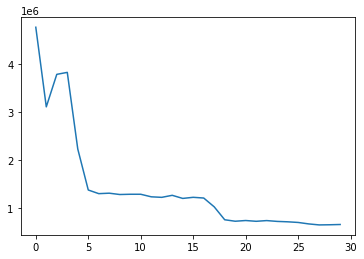

In [31]:
sns.lineplot(x=num_epochs, y=loss_values)

In [34]:
df = df = pd.DataFrame(data= list(zip(num_epochs, loss_values)), columns = ["Epochs","Training Loss"])

In [231]:
#df

<AxesSubplot:xlabel='Epochs', ylabel='Training Loss'>

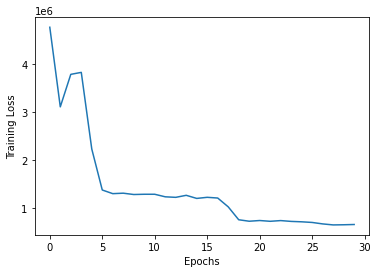

In [37]:
sns.lineplot(data = df, x="Epochs", y="Training Loss")

In [40]:
import pickle
file = open('MAP_10_10', 'rb')
pre10 = pickle.load(file)
file.close()

In [42]:
len(pre10)

66867

In [43]:
file = open("FT10len", "rb")
receipt_len = pickle.load(file)
file.close()

In [44]:
len(receipt_len)

66867

In [45]:
list(zip(receipt_len, pre10))

[(12, 1.75),
 (34, 0.08823529411764706),
 (11, 2.5454545454545454),
 (13, 1.1538461538461537),
 (12, 1.25),
 (14, 0.07142857142857142),
 (13, 0.0),
 (17, 0.17647058823529413),
 (13, 0.23076923076923078),
 (14, 1.5),
 (28, 0.10714285714285714),
 (14, 0.42857142857142855),
 (12, 1.75),
 (16, 0.0),
 (16, 0.0),
 (10, 0.1),
 (23, 4.565217391304348),
 (32, 1.40625),
 (11, 0.09090909090909091),
 (13, 0.7692307692307693),
 (33, 3.6363636363636362),
 (17, 0.35294117647058826),
 (20, 0.05),
 (14, 0.7142857142857143),
 (13, 0.7692307692307693),
 (13, 0.0),
 (12, 0.8333333333333334),
 (11, 0.2727272727272727),
 (15, 0.6666666666666666),
 (31, 0.6774193548387096),
 (10, 0.1),
 (11, 0.5454545454545454),
 (10, 0.0),
 (11, 0.2727272727272727),
 (47, 5.382978723404255),
 (10, 3.6),
 (23, 0.0),
 (11, 0.0),
 (12, 0.08333333333333333),
 (19, 0.05263157894736842),
 (12, 0.08333333333333333),
 (11, 0.2727272727272727),
 (13, 0.23076923076923078),
 (10, 0.0),
 (16, 0.9375),
 (13, 1.6153846153846154),
 (13, 0

In [215]:
rdf = pd.DataFrame(data = list(zip(receipt_len, pre10)), columns = ["Receipt Length","Precision@10"])

In [47]:
rdf.head()

,Len,Precision
0,12,1.750000
1,34,0.088235
2,11,2.545455
3,13,1.153846
4,12,1.250000


In [216]:
grdf = rdf[(rdf["Receipt Length"]>0)&(rdf["Receipt Length"]<48)].groupby(by=["Receipt Length"]).mean().reset_index() #& (rdf["Len"]<48)

In [140]:
grdf

,Receipt Length,Precision@10
0,10,0.400109
1,11,0.443104
2,12,0.471457
3,13,0.497848
4,14,0.546080
5,15,0.590446
6,16,0.613518
7,17,0.639724
8,18,0.712808
9,19,0.708564


In [217]:
grdf["Precision@10"] = (grdf["Precision@10"]-grdf["Precision@10"].min())/(grdf["Precision@10"].max() - grdf["Precision@10"].min())

In [133]:
grdf["Precision@10"] = (grdf["Precision@10"]-grdf["Precision@10"].mean())/(grdf["Precision@10"].std())

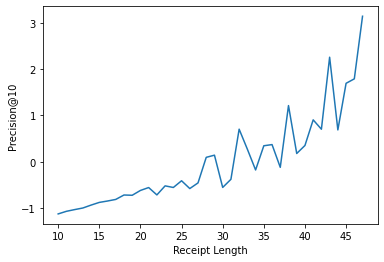

In [135]:
ax = sns.lineplot(data = grdf, x="Receipt Length", y="Precision@10")

<AxesSubplot:xlabel='Receipt Length', ylabel='Precision@10'>

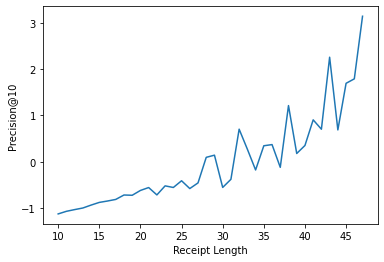

In [134]:
sns.lineplot(data = grdf, x="Receipt Length", y="Precision@10")

In [114]:
import pickle
file = open('FT10avgp', 'rb')
pre10_ft = pickle.load(file)
file.close()

In [218]:
rdf_ft = pd.DataFrame(data = list(zip(receipt_len, pre10_ft)), columns = ["Receipt Length","Precision@10"])

In [160]:
grdf_ft = rdf_ft[(rdf_ft["Receipt Length"]>0)&(rdf_ft["Receipt Length"]<48)].groupby(by=["Receipt Length"]).mean().reset_index() #& (rdf["Len"]<48)

In [219]:
grdf_ft["Precision@10"] = (grdf_ft["Precision@10"]- grdf_ft["Precision@10"].min())/(grdf_ft["Precision@10"].max() - grdf_ft["Precision@10"].min())

In [136]:
sns.lineplot(data = grdf_ft, x="Receipt Length", y="Precision@10", ax = ax)

<AxesSubplot:xlabel='Receipt Length', ylabel='Precision@10'>

In [220]:
grdf["FastText"] = grdf_ft["Precision@10"]

In [143]:
grdf

,Receipt Length,Precision@10,FastText
0,10,0.000000,0.253487
1,11,0.013153,0.244279
2,12,0.021826,0.234142
3,13,0.029899,0.257532
4,14,0.044654,0.251445
5,15,0.058226,0.234353
6,16,0.065284,0.248714
7,17,0.073301,0.231102
8,18,0.095658,0.237646
9,19,0.094360,0.263371


In [221]:
grdf["Word2vec"] = grdf["Precision@10"]

In [222]:
grdf.drop(columns = ["Precision@10"], inplace = True)

<AxesSubplot:xlabel='Receipt Length', ylabel='value'>

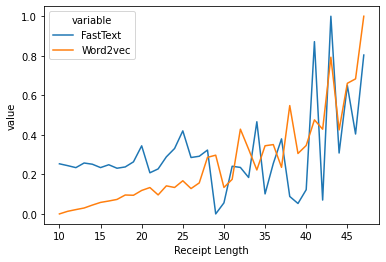

In [150]:
sns.lineplot(data=pd.melt(grdf, ['Receipt Length']), x="Receipt Length", y="value", hue='variable')

In [148]:
import pickle
file = open('Glove9avgp', 'rb')
pre10_gl = pickle.load(file)
file.close()

In [223]:
rdf_gl = pd.DataFrame(data = list(zip(receipt_len, pre10_gl)), columns = ["Receipt Length","Precision@10"])

In [224]:
grdf_gl = rdf_gl[(rdf_gl["Receipt Length"]>0)&(rdf_gl["Receipt Length"]<48)].groupby(by=["Receipt Length"]).mean().reset_index() #& (rdf["Len"]<48)

In [225]:
grdf_gl["Precision@10"] = (grdf_gl["Precision@10"]- grdf_gl["Precision@10"].min())/(grdf_gl["Precision@10"].max() - grdf_gl["Precision@10"].min())

<AxesSubplot:xlabel='Receipt Length', ylabel='Precision@10'>

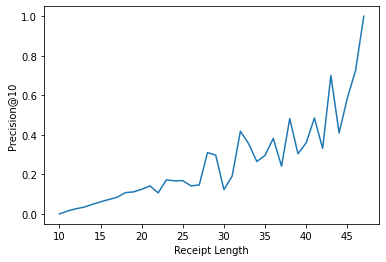

In [154]:
sns.lineplot(data = grdf_gl, x="Receipt Length", y="Precision@10")

In [226]:
grdf["Glove"] = grdf_gl["Precision@10"]

In [228]:
#grdf.drop(columns = ["Precision@10"], inplace = True)

<AxesSubplot:xlabel='Receipt Length', ylabel='value'>

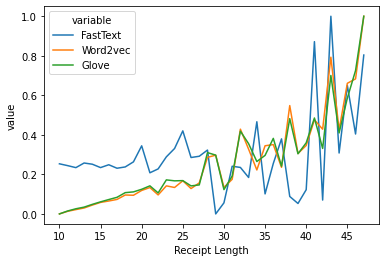

In [156]:

sns.lineplot(data=pd.melt(grdf, ['Receipt Length']), x="Receipt Length", y="value", hue='variable')

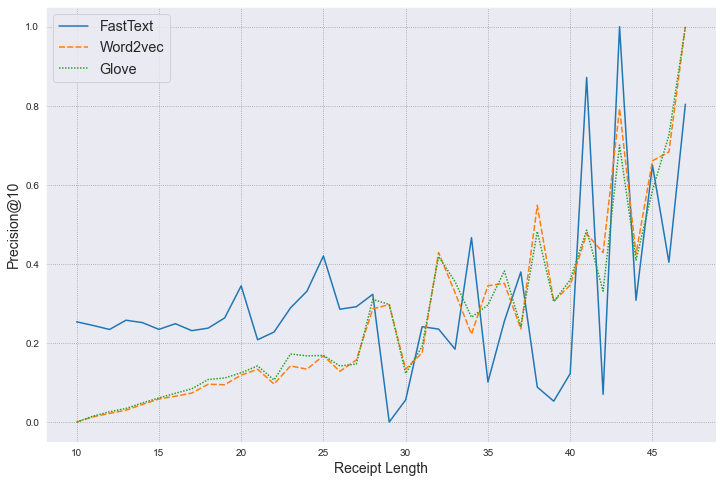

In [230]:
import matplotlib.pyplot as plt
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
ax = sns.lineplot(data=rdd, x="Receipt Length", y="Pre@10", hue='Model', style="Model")
plt.legend(fontsize='x-large', title_fontsize='40')
plt.xlabel('Receipt Length', fontsize=14)
plt.ylabel('Precision@10(Normalized)', fontsize=14)
# plt.setp(ax.get_legend().get_texts(), fontsize='15')
# plt.setp(ax.get_legend().get_title(), fontsize='15')
plt.show()
#plt.grid()  
fig = ax.get_figure()
fig.savefig("Normalized Model Comparasion Plot.png")

In [167]:
grdf["Word2Vec"] = grdf["Precision@10"]

In [229]:
rdd = pd.melt(grdf, ['Receipt Length'])
rdd.rename(columns = {"variable":"Model", "value":"Pre@10"}, inplace = True)


In [189]:
rdd["Pre@10"] = rdd["Pre@10"]/4

In [202]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 12,8

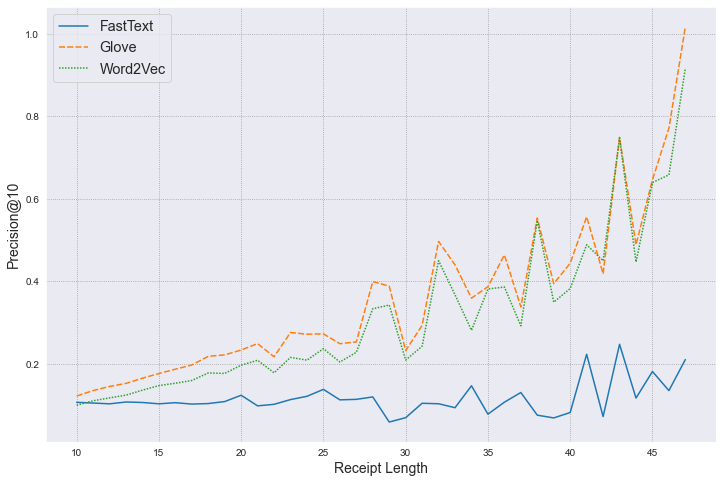

In [214]:
import matplotlib.pyplot as plt
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
ax = sns.lineplot(data=rdd, x="Receipt Length", y="Pre@10", hue='Model', style="Model")
plt.legend(fontsize='x-large', title_fontsize='40')
plt.xlabel('Receipt Length', fontsize=14)
plt.ylabel('Precision@10', fontsize=14)
# plt.setp(ax.get_legend().get_texts(), fontsize='15')
# plt.setp(ax.get_legend().get_title(), fontsize='15')
plt.show()
#plt.grid()  
fig = ax.get_figure()
fig.savefig("Model Comparasion Plot.png")

In [232]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 

Instructions for updating:
non-resource variables are not supported in the long term


In [233]:
print(tf.__version__)

2.0.0


In [234]:
from tensorboard.plugins import projector
TENSORBOARD_FILES_PATH = "./tensorboard"

In [ ]:
model.save_word2vec_format('doc_tensor.w2v', doctag_vec=True, word_vec=False)